# ResNet Ablation Study

## 1. ResNet 기본 블록 구성하기

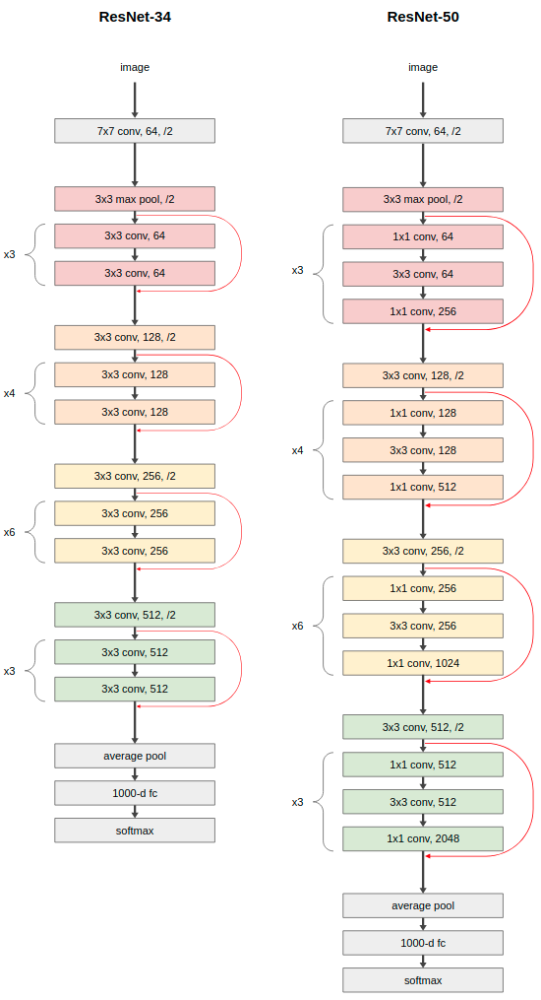

블록을 구현하기 위해서 ResNet-34 와 ResNet-50 의 특징을 살펴보도록 하겠습니다.  

- 공통점  
    1. ResNet의 블록은 CNN 레이어로 이루어져 있습니다.  
    2. 각 블록의 구조는 순서대로 3, 4, 6, 3개씩 반복되어있습니다.  
    3. 각 블록의 CNN 레이어의 채널수는 순서대로 64, 128, 256, 512로 이루어져 있습니다. (ResNet-50 마지막 CNN 레이어 제외)

- 차이점  
    1. ResNet-34 블록의 CNN 레이어는 3x3 커널로만 이루어져 있지만,  
    ResNet-50 블록은 3x3 커널로 이루어진 CNN 레이어를 중심으로 앞뒤로 1X1 커널로 이루어진 CNN 레이어가 붙어있습니다.  
    2. ResNet-50 블록의 마지막 CNN 레이어의 수는 64(x4), 128(x4), 256(x4), 512(x4)로 이루어져 있습니다.    

위의 특징을 바탕으로 블록을 구현해보도록 하겠습니다.

In [1]:
# 필요한 라이브러리 불러오기
from tensorflow import keras

import tensorflow_datasets as tfds
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# ResNet 블록의 레이어 함수
def resnet_block(x, n, channel, first, start_end, block_num):
    if first == False:
        x = keras.layers.Conv2D(
            filters=channel,
            kernel_size=(3,3),
            strides=2,
            padding='same',
            kernel_initializer='he_normal',
            name=f'block{block_num}_conv'
        )(x)
        x = keras.layers.BatchNormalization()(x)
        x = keras.layers.Activation('relu')(x)
            
    for cnn_num1 in range(n):
        cnn_num2 = 1
        pre_x = x
        if start_end == True:
            x = keras.layers.Conv2D(
                filters=channel,
                kernel_size=(1,1),
                padding='same',
                kernel_initializer='he_normal',
                name=f'block{block_num}_conv{cnn_num1}_{cnn_num2}'
            )(x)
            x = keras.layers.BatchNormalization()(x)
            x = keras.layers.Activation('relu')(x)
            cnn_num2 = cnn_num2 + 1

        x = keras.layers.Conv2D(
            filters=channel,
            kernel_size=(3,3),
            padding='same',
            kernel_initializer='he_normal',
            name=f'block{block_num}_conv{cnn_num1}_{cnn_num2}'
        )(x)
        x = keras.layers.BatchNormalization()(x)
        x = keras.layers.Activation('relu')(x)
        
        cnn_num2 = cnn_num2 + 1
        
        if start_end == False:                
            x = keras.layers.Conv2D(
                filters=channel,
                kernel_size=(3,3),
                padding='same',
                kernel_initializer='he_normal',
                name=f'block{block_num}_conv{cnn_num1}_{cnn_num2}'
            )(x)
            
            x = keras.layers.BatchNormalization()(x)
            x = keras.layers.Add()([x, pre_x])
            x = keras.layers.Activation('relu')(x)  
            continue
        
        if cnn_num1 == 0:
            pre_x = keras.layers.Conv2D(
                filters=channel*4,
                kernel_size=(1,1),
                padding='same',
                name=f'block{block_num}_short{cnn_num1}_{cnn_num2}'
            )(pre_x)
            pre_x = keras.layers.BatchNormalization()(pre_x)

        x = keras.layers.Conv2D(
            filters=channel*4,
            kernel_size=(1,1),
            padding='same',
            kernel_initializer='he_normal',
            name=f'block{block_num}_conv{cnn_num1}_{cnn_num2}'
        )(x)
        x = keras.layers.BatchNormalization()(x)
        
        x = keras.layers.Add()([x, pre_x])
        x = keras.layers.Activation('relu')(x)
             
    return x

# ResNet 블록 함수
def build_resnet_block(x, start_end=False, block_num=1):
    # 첫번째 블록일 때
    if block_num == 1:
        # Max Pooling 레이어 쌓기
        x = keras.layers.MaxPooling2D(
            pool_size=(3,3),
            padding='same',
            strides=2,
            name=f'block{block_num}_maxpooling'
        )(x)
        # 반복되는 CNN 레이어 쌓기
        x = resnet_block(x, 3, 64, True, start_end, block_num)
        return x

    # 두번째 블록일 때
    if block_num == 2:        
        # 반복되는 CNN 레이어 쌓기
        x = resnet_block(x, 4, 128, False, start_end, block_num)
        
        return x

    # 세번째 블록일 때
    if block_num == 3:
        # 반복되는 CNN 레이어 쌓기
        x = resnet_block(x, 6, 256, False, start_end, block_num)
        return x
    
    # 네번째 블록일 때
    if block_num == 4:
        # 반복되는 CNN 레이어 쌓기
        x = resnet_block(x, 3, 512, False, start_end, block_num)
        return x

## 2. ResNet-34, ResNet-50 Complete Model

이제 기본적인 블록을 만들 수 있는 함수를 만들었으니 이를 합쳐서 전체 모델을 만들 수 있는 함수를 만들어 보겠습니다.

In [3]:
# RestNet 모델 자체를 생성하는 함수
def build_resnet(input_shape=(32,32,3),
                 start_end = False,
                 num_classes=10):
    
    input_layer = keras.layers.Input(shape=input_shape)    # input layer 만들기
    output = input_layer
    
    # strides가 2인 CNN 레이어 쌓기
    output = keras.layers.Conv2D(
        filters=64,
        kernel_size=(7,7),
        strides=2,
        padding='same',
        kernel_initializer='he_normal',
        name='conv2d'
    )(output)
    # Batch Normalization 하기
    output = keras.layers.BatchNormalization()(output)
    output = keras.layers.Activation('relu')(output)
    
    # 블록의 구조 개수만큼 반복해서 블록 생성하기
    for i in range(4):
        output = build_resnet_block(output, start_end=start_end, block_num=i+1)

    # Average Pooling 레이어 쌓기
    output = keras.layers.AveragePooling2D(
        pool_size=(1,1),
        padding='same',
        strides=1,
        name='avg_pool'
    )(output)
    
    # Fully Connected 레이어 쌓기
    output = keras.layers.Flatten(name='fc1000')(output)
    
    # Softmax 함수 쌓기
    output = keras.layers.Dense(num_classes, activation='softmax', name='predictions')(output)
    
    model = keras.Model(
        inputs=input_layer,
        outputs=output
    )
    
    return model

### 1) ResNet-34

In [4]:
resnet_34 = build_resnet()
resnet_34.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 16, 16, 64)   9472        input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 16, 16, 64)   256         conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 16, 16, 64)   0           batch_normalization[0][0]        
______________________________________________________________________________________________

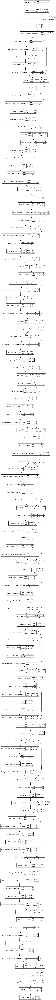

In [12]:
from IPython.display import SVG
from tensorflow.keras.utils import model_to_dot
from keras.utils.vis_utils import plot_model

tf.keras.utils.plot_model(resnet_34, to_file='resnet_34.png', show_shapes=True, show_layer_names=True)
# SVG(model_to_dot(resnet_34, show_shapes=True, dpi=20).create(prog='dot', format='svg'))

### 2) ResNet-50

In [13]:
resnet_50 = build_resnet(start_end=True)
resnet_50.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 16, 16, 64)   9472        input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_36 (BatchNo (None, 16, 16, 64)   256         conv2d[0][0]                     
__________________________________________________________________________________________________
activation_36 (Activation)      (None, 16, 16, 64)   0           batch_normalization_36[0][0]     
____________________________________________________________________________________________

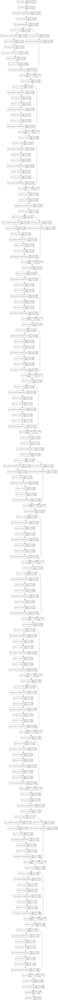

In [14]:
tf.keras.utils.plot_model(resnet_50, to_file='resnet_50.png', show_shapes=True, show_layer_names=True)
# SVG(model_to_dot(resnet_50, show_shapes=True).create(prog='dot', format='svg'))

## 3. 일반 네트워크(plain network) 만들기

### 1) 블록 코드 수정하기

위에서 resnet 블록을 만들기 위한 함수를 그대로 사용해서 skip connection이 없는 블록을 만들 수 있는 기능을 추가합니다.

In [15]:
# ResNet 블록의 레이어 함수
def resnet_block(x, n, channel, first, start_end, block_num, is_resnet=True):
    if first == False:
        x = keras.layers.Conv2D(
            filters=channel,
            kernel_size=(3,3),
            strides=2,
            padding='same',
            kernel_initializer='he_normal',
            name=f'block{block_num}_conv'
        )(x)
        x = keras.layers.BatchNormalization()(x)        
        x = keras.layers.Activation('relu')(x)
            
    for cnn_num1 in range(n):
        cnn_num2 = 1
        pre_x = x
        if start_end == True:
            x = keras.layers.Conv2D(
                filters=channel,
                kernel_size=(1,1),
                padding='same',
                kernel_initializer='he_normal',
                name=f'block{block_num}_conv{cnn_num1}_{cnn_num2}'
            )(x)
            x = keras.layers.BatchNormalization()(x)
            x = keras.layers.Activation('relu')(x)
            cnn_num2 = cnn_num2 + 1

        x = keras.layers.Conv2D(
            filters=channel,
            kernel_size=(3,3),
            padding='same',
            kernel_initializer='he_normal',
            name=f'block{block_num}_conv{cnn_num1}_{cnn_num2}'
        )(x)
        x = keras.layers.BatchNormalization()(x)
        x = keras.layers.Activation('relu')(x)
        
        cnn_num2 = cnn_num2 + 1
        
        if start_end == False:
            x = keras.layers.Conv2D(
                filters=channel,
                kernel_size=(3,3),
                padding='same',
                kernel_initializer='he_normal',
                name=f'block{block_num}_conv{cnn_num1}_{cnn_num2}'
            )(x)
            
            x = keras.layers.BatchNormalization()(x)
            
            if is_resnet == True:
                x = keras.layers.Add()([x, pre_x])
                
            x = keras.layers.Activation('relu')(x)  
            continue
                
        x = keras.layers.Conv2D(
            filters=channel*4,
            kernel_size=(1,1),
            padding='same',
            name=f'block{block_num}_conv{cnn_num1}_{cnn_num2}'
        )(x)
        x = keras.layers.BatchNormalization()(x)
        
        if is_resnet == True:
            if cnn_num1 == 0:
                pre_x = keras.layers.Conv2D(
                    filters=channel*4,
                    kernel_size=(1,1),
                    padding='same',
                    name=f'block{block_num}_short{cnn_num1}_{cnn_num2}'
                )(pre_x)
                pre_x = keras.layers.BatchNormalization()(pre_x)
            x = keras.layers.Add()([x, pre_x])
        
        x = keras.layers.Activation('relu')(x)
             
    return x

# ResNet 블록 함수
def build_resnet_block(x, start_end=False, block_num=1, is_resnet=True):
    # 첫번째 블록일 때
    if block_num == 1:
        # Max Pooling 레이어 쌓기
        x = keras.layers.MaxPooling2D(
            pool_size=(3,3),
            padding='same',
            strides=2,
            name=f'block{block_num}_maxpooling'
        )(x)
        # 반복되는 CNN 레이어 쌓기
        x = resnet_block(x, 3, 64, True, start_end, block_num, is_resnet)
        return x

    # 두번째 블록일 때
    if block_num == 2:        
        # 반복되는 CNN 레이어 쌓기
        x = resnet_block(x, 4, 128, False, start_end, block_num, is_resnet)
        
        return x

    # 세번째 블록일 때
    if block_num == 3:
        # 반복되는 CNN 레이어 쌓기
        x = resnet_block(x, 6, 256, False, start_end, block_num, is_resnet)
        return x
    
    # 네번째 블록일 때
    if block_num == 4:
        # 반복되는 CNN 레이어 쌓기
        x = resnet_block(x, 3, 512, False, start_end, block_num, is_resnet)
        return x

### 2) 전체 함수 코드 수정하기

위에서 만든 블록 함수를 토대로 전체 네트워크를 만들 수 있도록 전체 네트워크 코드를 수정합니다.  
 입력 이미지의 크기는 (224, 224, 3)으로 설정합니다.

In [16]:
# RestNet 모델 자체를 생성하는 함수
def build_resnet(input_shape=(224,224,3),
                 start_end = False,
                 num_classes=10,
                 is_resnet=True):
    
    input_layer = keras.layers.Input(shape=input_shape)    # input layer 만들기
    output = input_layer
    
    # strides가 2인 CNN 레이어 쌓기
    output = keras.layers.Conv2D(
        filters=64,
        kernel_size=(7,7),
        strides=2,
        padding='same',
        kernel_initializer='he_normal',
        name='conv2d'
    )(output)
    # Batch Normalization 하기
    output = keras.layers.BatchNormalization()(output)
    output = keras.layers.Activation('relu')(output)
    
    # 블록의 구조 개수만큼 반복해서 블록 생성하기
    for i in range(4):
        output = build_resnet_block(output, start_end=start_end, block_num=i+1, is_resnet=is_resnet)

    # Average Pooling 레이어 쌓기
    output = keras.layers.AveragePooling2D(
        pool_size=(1,1),
        padding='same',
        strides=1,
        name='avg_pool'
    )(output)
    
    # Fully Connected 레이어 쌓기
    output = keras.layers.Flatten(name='fc1000')(output)
    
    # Softmax 함수 쌓기
    output = keras.layers.Dense(num_classes, activation='sigmoid', name='predictions')(output)
    
    model = keras.Model(
        inputs=input_layer,
        outputs=output
    )
    
    return model

## 4. ResNEt-50 vs Plain-50 또는 ResNet-34 vs Plain-34

### 1) Ablation Study

ResNet-50 vs Plain-50 과 ResNet-34 vs Plain-34 에 대해서 학습을 진행하고, 결과를 비교해봅니다.  
입력 이미지는 tensorflow-datasets에서 제공하는 cats_vs_dog 데이터 셋을 사용합니다. 입력 이미지의 크기는 224x244x3 입니다.  

데이터는 고양이, 강아지 둘 중 하나로 분류하는 문제이기 때문에 이진분류에 해당합니다.  
그래서 마지막 출력 레이어는 sigmoid 함수를 사용할 것입니다. 또한 loss 계산은 binary cross entropy를 사용할 것입니다.  
또한 레이블 값이 0 or 1 형태인 정수형으로 표현되어 있기 때문에 원핫 인코딩 작업을 할 것입니다.

**데이터 불러오기**

In [10]:
# GPU 장착 확인하기
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [11]:
# 데이터셋 다운받기
import urllib3
urllib3.disable_warnings()

ds_train, ds_train_info = tfds.load('cats_vs_dogs',
                                    split='train[:80%]',
                                    as_supervised=True,
                                    with_info=True)

ds_test, ds_test_info = tfds.load('cats_vs_dogs',
                                  split='train[80%:]',
                                  as_supervised=True,
                                  with_info=True)

In [12]:
# 데이터 개수 확인하기
# print('Train :', tf.data.experimental.cardinality(ds_train))
# print('Test :', tf.data.experimental.cardinality(ds_test))

In [13]:
# 클래스 개수
ds_train_info.features['label'].num_classes

2

In [14]:
# 클래스 종류
ds_train_info.features['label'].names

['cat', 'dog']

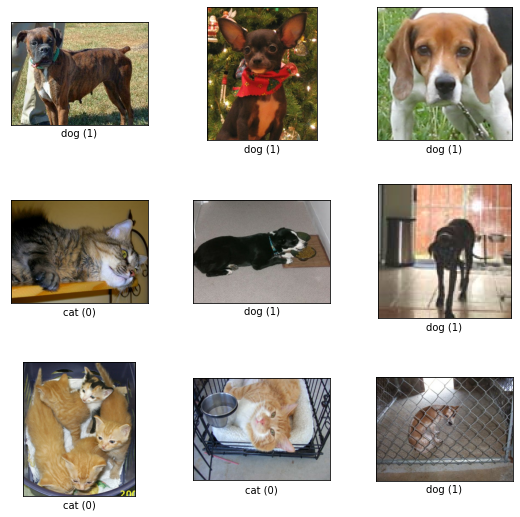

In [15]:
# 학습 데이터 이미지 샘플 확인하기
fig = tfds.show_examples(ds_train, ds_train_info)

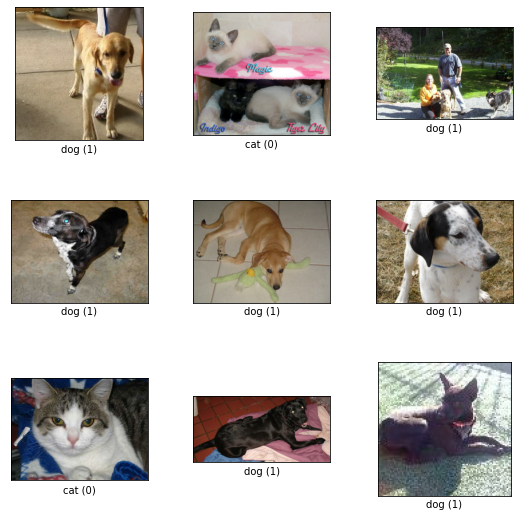

In [16]:
# 테스트 데이터 이미지 샘플 확인하기
fig = tfds.show_examples(ds_test, ds_test_info)

**데이터 전처리**

In [17]:
def preprocess(image, label):
    image = tf.cast(image, tf.float32) / 255
    image = tf.image.resize(image, size=(224,224))
    label = tf.one_hot(label, 2)
    
    return image,label

In [18]:
BATCH_SIZE = 16
EPOCH = 20

In [19]:
train = ds_train.map(preprocess).batch(BATCH_SIZE).repeat()
test = ds_test.map(preprocess).batch(BATCH_SIZE).repeat()

**ResNet-34 vs Plain-34**

In [17]:
plain_34 = build_resnet(input_shape=(224,224,3), start_end = False, num_classes=2, is_resnet=False)
plain_34.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 112, 112, 64)      9472      
_________________________________________________________________
batch_normalization_92 (Batc (None, 112, 112, 64)      256       
_________________________________________________________________
activation_88 (Activation)   (None, 112, 112, 64)      0         
_________________________________________________________________
block1_maxpooling (MaxPoolin (None, 56, 56, 64)        0         
_________________________________________________________________
block1_conv0_1 (Conv2D)      (None, 56, 56, 64)        36928     
_________________________________________________________________
batch_normalization_93 (Batc (None, 56, 56, 64)        256 

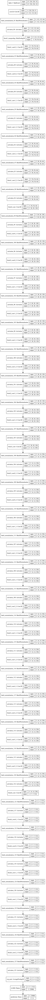

In [18]:
tf.keras.utils.plot_model(plain_34, to_file='plain_34.png', show_shapes=True, show_layer_names=True)
# SVG(model_to_dot(plain_34, show_shapes=True).create(prog='dot', format='svg'))

In [29]:
# 모델 설계
plain_34.compile(
    loss='binary_crossentropy',
    # loss='sparse_categorical_crossentropy',
    optimizer=tf.keras.optimizers.SGD(lr=0.3, clipnorm=1.),
    metrics=['accuracy'],
)

# 모델 학습
history_p_34 = plain_34.fit(
    train,
    steps_per_epoch = 18610 // BATCH_SIZE,
    validation_steps = 4652 // BATCH_SIZE,
    epochs=EPOCH,
    validation_data=test,
    verbose=1,
)

Train for 1163 steps, validate for 290 steps
Epoch 1/20
1163/1163 [==============================] - 103s 89ms/step - loss: 0.9250 - accuracy: 0.5116 - val_loss: 0.6916 - val_accuracy: 0.5144
Epoch 2/20
1163/1163 [==============================] - 100s 86ms/step - loss: 0.6937 - accuracy: 0.5170 - val_loss: 0.6926 - val_accuracy: 0.5111
Epoch 3/20
1163/1163 [==============================] - 102s 88ms/step - loss: 0.6998 - accuracy: 0.5042 - val_loss: 0.6931 - val_accuracy: 0.5108
Epoch 4/20
1163/1163 [==============================] - 102s 88ms/step - loss: 0.6940 - accuracy: 0.5065 - val_loss: 0.6928 - val_accuracy: 0.5109
Epoch 5/20
1163/1163 [==============================] - 103s 88ms/step - loss: 0.6942 - accuracy: 0.5038 - val_loss: 0.6929 - val_accuracy: 0.5098
Epoch 6/20
1163/1163 [==============================] - 103s 88ms/step - loss: 0.6931 - accuracy: 0.5108 - val_loss: 0.6916 - val_accuracy: 0.5136
Epoch 7/20
1163/1163 [==============================] - 103s 88ms/step - 

In [19]:
resnet_34 = build_resnet(input_shape=(224,224,3), start_end = False, num_classes=2, is_resnet=True)
resnet_34.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 112, 112, 64) 9472        input_4[0][0]                    
__________________________________________________________________________________________________
batch_normalization_128 (BatchN (None, 112, 112, 64) 256         conv2d[0][0]                     
__________________________________________________________________________________________________
activation_124 (Activation)     (None, 112, 112, 64) 0           batch_normalization_128[0][0]    
____________________________________________________________________________________________

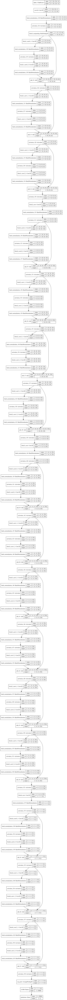

In [20]:
tf.keras.utils.plot_model(resnet_34, to_file='resnet_34.png', show_shapes=True, show_layer_names=True)
# SVG(model_to_dot(resnet_34, show_shapes=True).create(prog='dot', format='svg'))

In [31]:
resnet_34.compile(
    loss='binary_crossentropy',
    # loss='sparse_categorical_crossentropy',
    optimizer=tf.keras.optimizers.SGD(lr=0.3, clipnorm=1.),
    metrics=['accuracy'],
)

history_r_34 = resnet_34.fit(
    train,
    steps_per_epoch= 18610 // BATCH_SIZE,
    validation_steps= 4652 // BATCH_SIZE,
    epochs=EPOCH,
    validation_data=test,
    verbose=1,
)

Train for 1163 steps, validate for 290 steps
Epoch 1/20
1163/1163 [==============================] - 101s 87ms/step - loss: 2.6372 - accuracy: 0.5436 - val_loss: 0.6849 - val_accuracy: 0.5474
Epoch 2/20
1163/1163 [==============================] - 99s 85ms/step - loss: 0.6821 - accuracy: 0.5581 - val_loss: 0.6824 - val_accuracy: 0.5630
Epoch 3/20
1163/1163 [==============================] - 99s 85ms/step - loss: 0.6786 - accuracy: 0.5642 - val_loss: 0.6785 - val_accuracy: 0.5680
Epoch 4/20
1163/1163 [==============================] - 99s 85ms/step - loss: 0.6748 - accuracy: 0.5737 - val_loss: 0.6759 - val_accuracy: 0.5735
Epoch 5/20
1163/1163 [==============================] - 103s 89ms/step - loss: 0.6706 - accuracy: 0.5842 - val_loss: 0.6745 - val_accuracy: 0.5809
Epoch 6/20
1163/1163 [==============================] - 99s 85ms/step - loss: 0.6662 - accuracy: 0.5913 - val_loss: 0.6683 - val_accuracy: 0.5856
Epoch 7/20
1163/1163 [==============================] - 114s 98ms/step - loss

**ResNet-50 vs Plain-50**

In [21]:
plain_50 = build_resnet(input_shape=(224,224,3), start_end = True, num_classes=2, is_resnet=False)
plain_50.summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 112, 112, 64)      9472      
_________________________________________________________________
batch_normalization_164 (Bat (None, 112, 112, 64)      256       
_________________________________________________________________
activation_160 (Activation)  (None, 112, 112, 64)      0         
_________________________________________________________________
block1_maxpooling (MaxPoolin (None, 56, 56, 64)        0         
_________________________________________________________________
block1_conv0_1 (Conv2D)      (None, 56, 56, 64)        4160      
_________________________________________________________________
batch_normalization_165 (Bat (None, 56, 56, 64)        256 

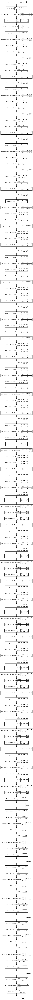

In [22]:
tf.keras.utils.plot_model(plain_50, to_file='plain_50.png', show_shapes=True, show_layer_names=True)
# SVG(model_to_dot(plain_50, show_shapes=True).create(prog='dot', format='svg'))

In [28]:
# 모델 설계
plain_50.compile(
    loss='binary_crossentropy',
    # loss='sparse_categorical_crossentropy',
    optimizer=tf.keras.optimizers.SGD(lr=0.05, clipnorm=1.),
    metrics=['accuracy'],
)

# 모델 학습
history_p_50 = plain_50.fit(
    train,
    steps_per_epoch= 18610 // BATCH_SIZE,
    validation_steps= 4652 // BATCH_SIZE,
    epochs=EPOCH,
    validation_data=test,
    verbose=1,
)

Train for 1163 steps, validate for 290 steps
Epoch 1/20
1163/1163 [==============================] - 161s 138ms/step - loss: 1.5728 - accuracy: 0.5015 - val_loss: 0.8393 - val_accuracy: 0.5083
Epoch 2/20
1163/1163 [==============================] - 157s 135ms/step - loss: 0.7282 - accuracy: 0.5082 - val_loss: 0.7536 - val_accuracy: 0.5098
Epoch 3/20
1163/1163 [==============================] - 156s 134ms/step - loss: 0.6973 - accuracy: 0.5072 - val_loss: 0.7062 - val_accuracy: 0.5134
Epoch 4/20
1163/1163 [==============================] - 156s 134ms/step - loss: 0.6923 - accuracy: 0.5158 - val_loss: 0.6954 - val_accuracy: 0.5130
Epoch 5/20
1163/1163 [==============================] - 156s 134ms/step - loss: 0.6904 - accuracy: 0.5181 - val_loss: 0.6948 - val_accuracy: 0.5150
Epoch 6/20
1163/1163 [==============================] - 156s 134ms/step - loss: 0.6892 - accuracy: 0.5205 - val_loss: 0.6953 - val_accuracy: 0.5138
Epoch 7/20
1163/1163 [==============================] - 156s 135ms/

In [23]:
resnet_50 = build_resnet(input_shape=(224,224,3), start_end = True, num_classes=2, is_resnet=True)
resnet_50.summary()

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 112, 112, 64) 9472        input_6[0][0]                    
__________________________________________________________________________________________________
batch_normalization_216 (BatchN (None, 112, 112, 64) 256         conv2d[0][0]                     
__________________________________________________________________________________________________
activation_212 (Activation)     (None, 112, 112, 64) 0           batch_normalization_216[0][0]    
____________________________________________________________________________________________

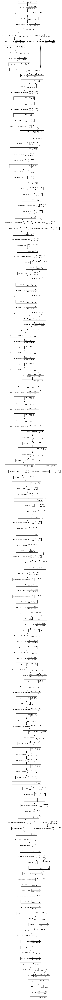

In [24]:
tf.keras.utils.plot_model(resnet_50, to_file='resnet_50.png', show_shapes=True, show_layer_names=True)
# SVG(model_to_dot(resnet_50, show_shapes=True).create(prog='dot', format='svg'))

In [31]:
resnet_50.compile(
    loss='binary_crossentropy',
    # loss='sparse_categorical_crossentropy',
    optimizer=tf.keras.optimizers.SGD(lr=0.05, clipnorm=1.),
    metrics=['accuracy'],
)

history_r_50 = resnet_50.fit(
    train,
    steps_per_epoch= 18610 // BATCH_SIZE,
    validation_steps= 4652 // BATCH_SIZE,
    epochs=EPOCH,
    validation_data=test,
    verbose=1,
)

Train for 1163 steps, validate for 290 steps
Epoch 1/20
1163/1163 [==============================] - 179s 154ms/step - loss: 4.9364 - accuracy: 0.5335 - val_loss: 39.0592 - val_accuracy: 0.5378
Epoch 2/20
1163/1163 [==============================] - 175s 151ms/step - loss: 0.9531 - accuracy: 0.5733 - val_loss: 0.8122 - val_accuracy: 0.5907
Epoch 3/20
1163/1163 [==============================] - 175s 151ms/step - loss: 0.6831 - accuracy: 0.6138 - val_loss: 0.6742 - val_accuracy: 0.6283
Epoch 4/20
1163/1163 [==============================] - 175s 150ms/step - loss: 0.6380 - accuracy: 0.6432 - val_loss: 0.6755 - val_accuracy: 0.6499
Epoch 5/20
1163/1163 [==============================] - 175s 151ms/step - loss: 0.6138 - accuracy: 0.6618 - val_loss: 0.6801 - val_accuracy: 0.6544
Epoch 6/20
1163/1163 [==============================] - 175s 151ms/step - loss: 0.5938 - accuracy: 0.6835 - val_loss: 0.6613 - val_accuracy: 0.6643
Epoch 7/20
1163/1163 [==============================] - 175s 151ms

### 2) 시각화

학습을 통해 만들어진 history를 matplolib로 시각화하여 두 모델의 검증 정확도(validation accuracy)와 검증 손실(validation loss)가 어떻게 다른지 살펴보겠습니다.

**ResNet-34 vs Plain-34**

1. 정확도

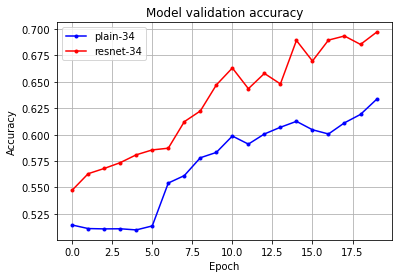

In [32]:
x_len = np.arange(len(history_p_34.history['val_accuracy']))
plt.plot(x_len, history_p_34.history['val_accuracy'], marker='.', c='b', label='plain-34')
plt.plot(x_len, history_r_34.history['val_accuracy'], marker='.', c='r', label='resnet-34')
plt.title('Model validation accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='upper left')
plt.grid()
plt.show()

2. 손실

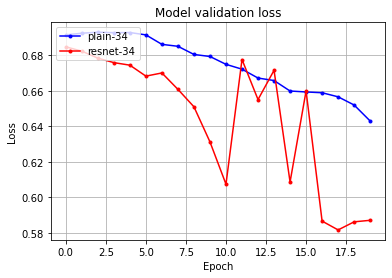

In [33]:
x_len = np.arange(len(history_p_34.history['val_loss']))
plt.plot(x_len, history_p_34.history['val_loss'], marker='.', c='b', label='plain-34')
plt.plot(x_len, history_r_34.history['val_loss'], marker='.', c='r', label='resnet-34')
plt.title('Model validation loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper left')
plt.grid()
plt.show()

**ResNet-50 vs Plain-50**

1. 정확도

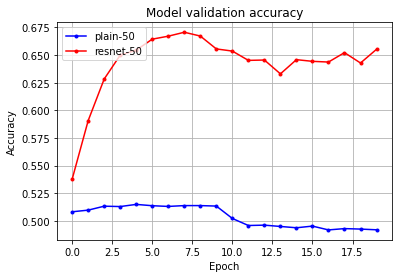

In [34]:
x_len = np.arange(len(history_p_50.history['val_accuracy']))
plt.plot(x_len, history_p_50.history['val_accuracy'], marker='.', c='b', label='plain-50')
plt.plot(x_len, history_r_50.history['val_accuracy'], marker='.', c='r', label='resnet-50')
plt.title('Model validation accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='upper left')
plt.grid()
plt.show()

2. 손실

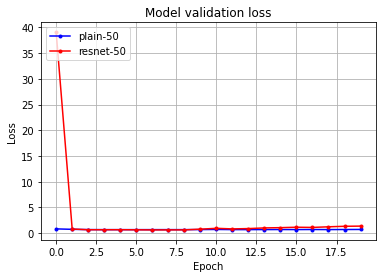

In [35]:
x_len = np.arange(len(history_p_50.history['val_loss']))
plt.plot(x_len, history_p_50.history['val_loss'], marker='.', c='b', label='plain-50')
plt.plot(x_len, history_r_50.history['val_loss'], marker='.', c='r', label='resnet-50')
plt.title('Model validation loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper left')
plt.grid()
plt.show()

## 5. 루브릭

**1. ResNet-34, ResNet-50 모델 구현이 정상적으로 진행되었는가?**  

위의 코드에서 SVG 함수를 실행하여 ResNet 모델이 어떻게 구현되었는지 확인해보면, skip connection이 추가된 것을 확인할 수 있습니다.

**2. 구현한 ResNet 모델을 활용하여 Image Classification 모델 훈련이 가능한가?**  

위 그래프에서 cats vs dogs 데이터셋으로 학습시 loss 감소와 accuracy 증가가 보인것을 확인할 수 있습니다.

**3. Ablation Study 결과가 바른 포맷으로 제출되었는가?**

위 그래프에서 Plain 모델과 ReNet모델을 비교하여 보았을때, 학습을 하면 할수록 Plain모델보다 ResNet모델의 accuray가 더 높고 loss가 더 낮은 것을 확인 할 수 있습니다.

## 6. 느낀점

처음에 ResNet 모델을 구현하고 학습을 시켰을 때, ResNet 모델보다 일반 모델이 더 성능이 좋았다.  
하지만 배치 사이즈(batch size)와 학습률(learning rate)을 작게 하니 일반 모델보다 ResNet모델이 훨씬 더 성능이 좋게 나왔다.

> *보통 배치 사이즈는 크게할수록, 학습률은 작게할수록 성능이 좋아진다. (대신 시간이 오래 걸림)*  
*하지만 ResNet 모델은 배치 사이즈를 작게하고, 학습률을 크게해도 성능이 좋아진다 !!*

## 7. 궁금한점

ResNet 모델의 CNN 레이어는 어떤 필터의 종류를 쓸까...?

> 이걸 보고 계시는 퍼실님은 저에게 정답을 알려주시면 감사하겠습니다... ㅎㅅㅎ;;